In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
import tensorflow as tf
import script.loss as l
import os
import cv2
from sklearn.model_selection import KFold
import script.models as m
from script.loss import *

# must run

In [2]:
def image_mask_generator(image_paths, mask_paths, batch_size):
    num_training_samples = len(image_paths)
    while True:
        for i in range(0, num_training_samples, batch_size):
            batch_training_image_paths = image_paths[i:i + batch_size]
            batch_training_mask_paths = mask_paths[i:i + batch_size]

            batch_training_images = []
            batch_training_masks = []

            for image_path, mask_path in zip(batch_training_image_paths, batch_training_mask_paths):
                image = cv2.imread(image_path)
                image = image / 255.0  # Normalize to [0, 1]
                batch_training_images.append(image)

                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                mask = mask / 255.0  # Normalize to [0, 1]
                batch_training_masks.append(mask)

            batch_training_images = np.array(batch_training_images)
            batch_training_masks = np.array(batch_training_masks)

            yield batch_training_images, batch_training_masks


In [3]:
def count_nuclei(mask):
    mask_gray = mask.astype(np.uint8)
    _, mask_binary = cv2.threshold(mask_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(mask_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return (len(contours))

In [4]:
custom_objects = {
    'dice_loss': dice_loss,
    'dice_coefficient': dice_coefficient
}
models=[]
for i in range(1):
    m=tf.keras.models.load_model(f"Models\\test\\{i+1}",custom_objects=custom_objects)
    models.append(m)

In [5]:
k=5
kf = KFold(n_splits=k, shuffle=True)
method = 'Macenko'
reference = 'img4'

# train

In [5]:
train_image  = os.listdir(f'datasets\\panuke\\train\\method_{method}\\reference_{reference}')
train_mask = os.listdir('datasets\\panuke\\train\\mask binary')
train_image = [f'datasets\\panuke\\train\\method_{method}\\reference_{reference}\\' + element for element in train_image]
train_mask = ['datasets\\panuke\\train\\mask binary\\' + element for element in train_mask]
len(train_image)

6280

In [12]:
test_image  = os.listdir(f'datasets\\panuke\\test\\method_{method}\\reference_{reference}')
test_mask = os.listdir('datasets\\panuke\\test\\mask binary')
test_image = [f'datasets\\panuke\\test\\method_{method}\\reference_{reference}\\' + element for element in test_image]
test_mask = ['datasets\\panuke\\test\\mask binary\\' + element for element in test_mask]
len(test_image)
nuclei=[]
reference_masks = []
nuclei=[]
for i in range(len(test_mask)):
        masks=(cv2.imread(test_mask[i], cv2.IMREAD_GRAYSCALE))
        masks=masks/255
        reference_masks.append(masks)
        nuclei.append(count_nuclei(masks))
nuclei_sum = np.sum(nuclei)

In [7]:
models = []
histories = []
i=0
batch_size=8
    # Perform K-fold cross-validation
for fold, (train_index, val_index) in enumerate(kf.split(train_image)):
        model = m.attnet()
        print(f"{i+1}")

        # Create training and validation data generators for this fold
        train_image_fold = [train_image[i] for i in train_index]
        train_mask_fold = [train_mask[i] for i in train_index]
        val_image_fold = [train_image[i] for i in val_index]
        val_mask_fold = [train_mask[i] for i in val_index]

        train_generator = image_mask_generator(train_image_fold, train_mask_fold,batch_size)
        validation_generator = image_mask_generator(val_image_fold, val_mask_fold,batch_size)

        # Define steps per epoch for training and validation
        steps_per_epoch = len(train_image_fold) // batch_size
        validation_steps = len(val_image_fold) // batch_size

        # Fit the model for this fold
        history = model.fit(
            train_generator,
            steps_per_epoch=steps_per_epoch,
            epochs=100,
            validation_data=validation_generator,
            validation_steps=validation_steps,
            verbose=1
        )

        model.save(f"Models\\test\\{i+1}")

        # Store the history for this fold
        histories.append(history)
        models.append(model)
        i+=1

1
Epoch 1/100
628/628 [==============================] - 169s 223ms/step - loss: 0.3551 - dice_coefficient: 0.6449 - val_loss: 0.2671 - val_dice_coefficient: 0.7329
Epoch 2/100
628/628 [==============================] - 117s 186ms/step - loss: 0.2482 - dice_coefficient: 0.7518 - val_loss: 0.2457 - val_dice_coefficient: 0.7543
Epoch 3/100
628/628 [==============================] - 111s 177ms/step - loss: 0.2296 - dice_coefficient: 0.7704 - val_loss: 0.2281 - val_dice_coefficient: 0.7719
Epoch 4/100
628/628 [==============================] - 122s 195ms/step - loss: 0.2198 - dice_coefficient: 0.7802 - val_loss: 0.2227 - val_dice_coefficient: 0.7773
Epoch 5/100
628/628 [==============================] - 102s 163ms/step - loss: 0.2138 - dice_coefficient: 0.7862 - val_loss: 0.2112 - val_dice_coefficient: 0.7888
Epoch 6/100
628/628 [==============================] - 111s 177ms/step - loss: 0.2085 - dice_coefficient: 0.7915 - val_loss: 0.2084 - val_dice_coefficient: 0.7916
Epoch 7/100
628/628 

INFO:tensorflow:Assets written to: Models\test\1\assets


INFO:tensorflow:Assets written to: Models\test\1\assets


2
Epoch 1/100
628/628 [==============================] - 109s 171ms/step - loss: 0.3611 - dice_coefficient: 0.6389 - val_loss: 0.2682 - val_dice_coefficient: 0.7318
Epoch 2/100
628/628 [==============================] - 112s 178ms/step - loss: 0.2478 - dice_coefficient: 0.7522 - val_loss: 0.2391 - val_dice_coefficient: 0.7609
Epoch 3/100
628/628 [==============================] - 112s 179ms/step - loss: 0.2302 - dice_coefficient: 0.7698 - val_loss: 0.2155 - val_dice_coefficient: 0.7845
Epoch 4/100
628/628 [==============================] - 112s 179ms/step - loss: 0.2213 - dice_coefficient: 0.7787 - val_loss: 0.2153 - val_dice_coefficient: 0.7847
Epoch 5/100
628/628 [==============================] - 77s 122ms/step - loss: 0.2138 - dice_coefficient: 0.7862 - val_loss: 0.2081 - val_dice_coefficient: 0.7919
Epoch 6/100
628/628 [==============================] - 102s 163ms/step - loss: 0.2091 - dice_coefficient: 0.7909 - val_loss: 0.2037 - val_dice_coefficient: 0.7963
Epoch 7/100
628/628 [

INFO:tensorflow:Assets written to: Models\test\2\assets


INFO:tensorflow:Assets written to: Models\test\2\assets


3
Epoch 1/100
628/628 [==============================] - 37s 57ms/step - loss: 0.3926 - dice_coefficient: 0.6074 - val_loss: 0.2853 - val_dice_coefficient: 0.7147
Epoch 2/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2554 - dice_coefficient: 0.7446 - val_loss: 0.2312 - val_dice_coefficient: 0.7688
Epoch 3/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2323 - dice_coefficient: 0.7677 - val_loss: 0.2256 - val_dice_coefficient: 0.7744
Epoch 4/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2217 - dice_coefficient: 0.7783 - val_loss: 0.2182 - val_dice_coefficient: 0.7818
Epoch 5/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2148 - dice_coefficient: 0.7852 - val_loss: 0.2083 - val_dice_coefficient: 0.7917
Epoch 6/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2092 - dice_coefficient: 0.7908 - val_loss: 0.2095 - val_dice_coefficient: 0.7905
Epoch 7/100
628/628 [===========

INFO:tensorflow:Assets written to: Models\test\3\assets


INFO:tensorflow:Assets written to: Models\test\3\assets


4
Epoch 1/100
628/628 [==============================] - 37s 57ms/step - loss: 0.3515 - dice_coefficient: 0.6485 - val_loss: 0.2690 - val_dice_coefficient: 0.7310
Epoch 2/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2488 - dice_coefficient: 0.7512 - val_loss: 0.2316 - val_dice_coefficient: 0.7684
Epoch 3/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2313 - dice_coefficient: 0.7687 - val_loss: 0.2261 - val_dice_coefficient: 0.7739
Epoch 4/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2224 - dice_coefficient: 0.7776 - val_loss: 0.2183 - val_dice_coefficient: 0.7817
Epoch 5/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2161 - dice_coefficient: 0.7839 - val_loss: 0.2179 - val_dice_coefficient: 0.7821
Epoch 6/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2108 - dice_coefficient: 0.7892 - val_loss: 0.2141 - val_dice_coefficient: 0.7859
Epoch 7/100
628/628 [===========

INFO:tensorflow:Assets written to: Models\test\4\assets


INFO:tensorflow:Assets written to: Models\test\4\assets


5
Epoch 1/100
628/628 [==============================] - 37s 56ms/step - loss: 0.4992 - dice_coefficient: 0.5008 - val_loss: 0.3590 - val_dice_coefficient: 0.6410
Epoch 2/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2920 - dice_coefficient: 0.7080 - val_loss: 0.2697 - val_dice_coefficient: 0.7303
Epoch 3/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2393 - dice_coefficient: 0.7607 - val_loss: 0.2365 - val_dice_coefficient: 0.7635
Epoch 4/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2241 - dice_coefficient: 0.7759 - val_loss: 0.2229 - val_dice_coefficient: 0.7771
Epoch 5/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2156 - dice_coefficient: 0.7844 - val_loss: 0.2236 - val_dice_coefficient: 0.7764
Epoch 6/100
628/628 [==============================] - 35s 56ms/step - loss: 0.2096 - dice_coefficient: 0.7904 - val_loss: 0.2170 - val_dice_coefficient: 0.7830
Epoch 7/100
628/628 [===========

INFO:tensorflow:Assets written to: Models\test\5\assets


INFO:tensorflow:Assets written to: Models\test\5\assets


In [8]:
[histories[i].history['dice_coefficient'][-1] for i in range(5)]

[0.8723597526550293,
 0.8705923557281494,
 0.8706001043319702,
 0.8694261908531189,
 0.8682112097740173]

In [9]:
[histories[i].history['val_dice_coefficient'][-1] for i in range(5)]

[0.7985000610351562,
 0.8021830916404724,
 0.7981786727905273,
 0.7992189526557922,
 0.7982147336006165]

# Pannuke

In [13]:
batch_size = 1
dice = []
pred=[]
bpq=[]
aji=[]
n_dice=[]
for model_index, model in enumerate(models):
    d,a,b,nd=0,0,0,0
    print(f"Making predictions with Model {model_index+1}/{5}")
    test_generator = image_mask_generator(test_image, test_mask,batch_size)

    predictions = model.predict(test_generator, steps=(len(test_image) // batch_size))
    predictions=tf.cast((tf.squeeze(predictions) > 0.5), tf.int32)
    pred.append(predictions)
    for i in range(len(test_mask)):
        d+=(dice_coefficient(reference_masks[i],predictions[i]).numpy())
        nd+=(nuclei[i]*(dice_coefficient(reference_masks[i],predictions[i]).numpy())/nuclei_sum)
        a+=(get_fast_aji(reference_masks[i],predictions[i]))
        b+=(get_fast_pq(reference_masks[i],predictions[i]))
    dice.append(d/(len(test_mask)))
    aji.append(a/(len(test_mask)))
    bpq.append(b/(len(test_mask)))
    n_dice.append(nd)
print(dice)
print(aji)
print(bpq)
print(n_dice)

Making predictions with Model 1/5
1571/1571 [==============================] - 10s 6ms/step
Making predictions with Model 2/5
1571/1571 [==============================] - 6s 4ms/step
Making predictions with Model 3/5
1571/1571 [==============================] - 6s 4ms/step
Making predictions with Model 4/5
1571/1571 [==============================] - 7s 4ms/step
Making predictions with Model 5/5
1571/1571 [==============================] - 6s 4ms/step
[0.7372853065002465, 0.733458517932797, 0.7317398249513825, 0.7341778856294825, 0.7342140478460981]
[0.61819528283593, 0.6116129333043848, 0.6114122077388591, 0.615414238077779, 0.6155857251034232]
[0.575222829164098, 0.5626121025755586, 0.5631555959141591, 0.5715677520440305, 0.5708908696599183]
[0.8028027589999541, 0.7960297390665482, 0.7967261626048091, 0.8017889600712131, 0.8003260749789194]


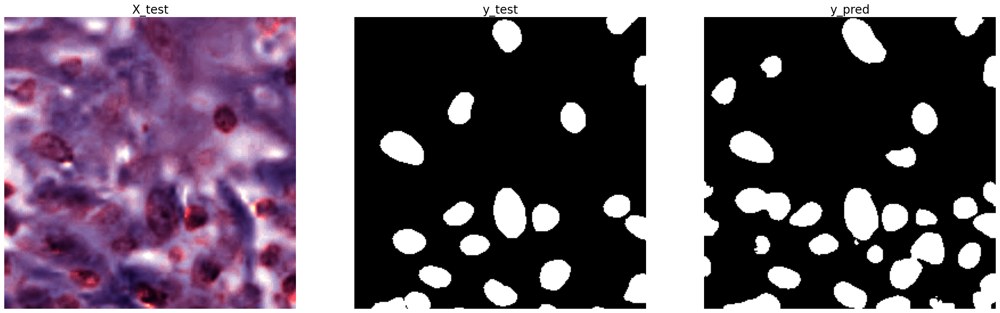

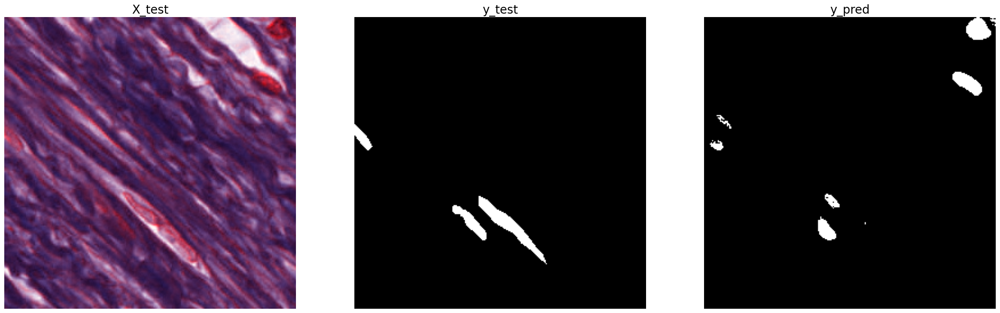

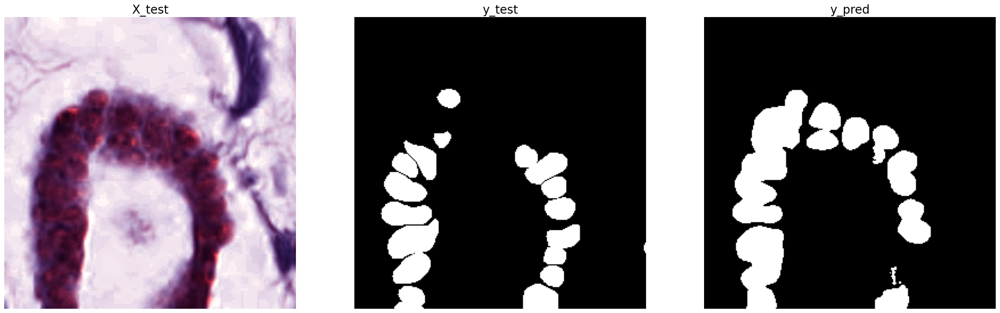

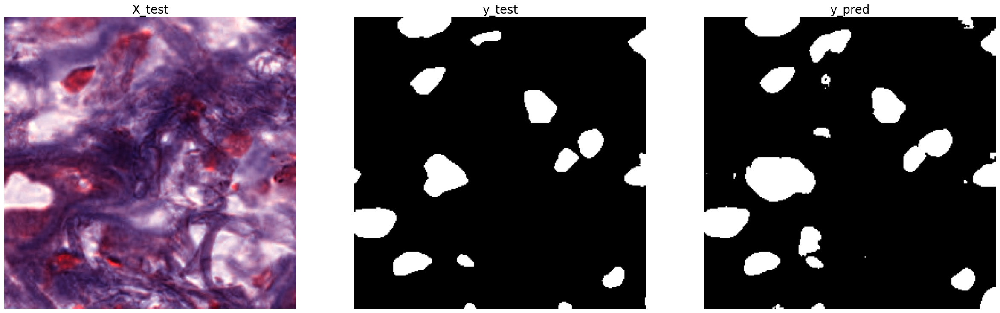

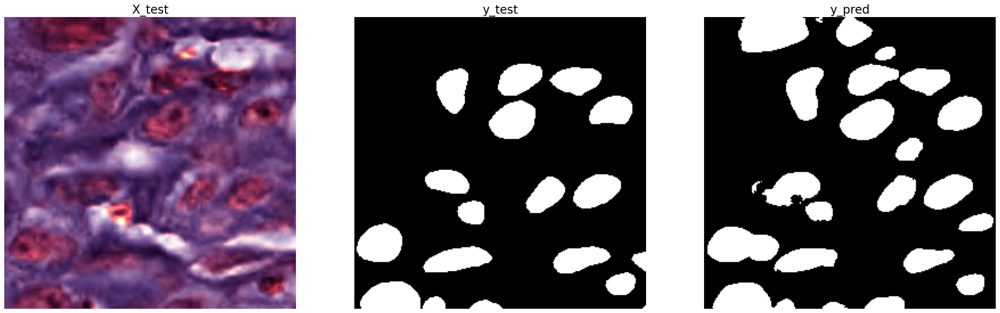

In [14]:
for i in range(5):
    j=1
    plt.figure(figsize=(30,60))
    plt.subplot(5,3,j)
    plt.imshow(cv2.imread(test_image[i]))
    plt.axis('off')
    plt.title('X_test', fontsize = 20)
    j+=1

    plt.subplot(5,3,j)
    plt.imshow(reference_masks[i],cmap='gray')
    plt.axis('off')
    plt.title('y_test', fontsize = 20)
    j+=1

    plt.subplot(5,3,j)
    plt.imshow(pred[0][i],cmap='gray')
    plt.axis('off')
    plt.title('y_pred', fontsize = 20)
    j+=1

plt.show()

# nuln

In [6]:
train_mask = os.listdir('datasets\\Nuln\\train\\mask binary')
train_mask = ['datasets\\Nuln\\train\\mask binary\\' + element for element in train_mask]
test_mask = os.listdir('datasets\\Nuln\\test\\mask binary')
test_mask = ['datasets\\Nuln\\test\\mask binary\\' + element for element in test_mask]
test_mask+=train_mask

train_image  = os.listdir(f'datasets\\Nuln\\train\\method_{method}\\reference_{reference}')
train_image = [f'datasets\\Nuln\\train\\method_{method}\\reference_{reference}\\' + element for element in train_image]
test_image  = os.listdir(f'datasets\\Nuln\\test\\method_{method}\\reference_{reference}')
test_image = [f'datasets\\Nuln\\test\\method_{method}\\reference_{reference}\\' + element for element in test_image]
test_image+=train_image

reference_masks = []
nuclei=[]
for i in range(len(test_mask)):
        masks=(cv2.imread(test_mask[i], cv2.IMREAD_GRAYSCALE))
        masks=masks/255
        reference_masks.append(masks)
        nuclei.append(count_nuclei(masks))
nuclei_sum = np.sum(nuclei)

In [7]:
batch_size = 1
dice = []
pred=[]
bpq=[]
aji=[]
n_dice=[]
for model_index, model in enumerate(models):
    d,a,b,nd=[],[],[],[]
    print(f"Making predictions with Model {model_index+1}/{5}")
    test_generator = image_mask_generator(test_image, test_mask,batch_size)

    predictions = model.predict(test_generator, steps=(len(test_image) // batch_size))
    predictions=tf.cast((tf.squeeze(predictions) > 0.5), tf.int32)
    pred.append(predictions)
    for i in range(len(test_mask)):
        d.append(dice_coefficient(reference_masks[i],predictions[i]).numpy())
        nd.append(nuclei[i]*(dice_coefficient(reference_masks[i],predictions[i]).numpy())/nuclei_sum)
        a.append(get_fast_aji(reference_masks[i],predictions[i]))
        b.append(get_fast_pq(reference_masks[i],predictions[i]))
    dice.append(np.sum(d)/(len(test_mask)))
    aji.append(np.sum(a)/(len(test_mask)))
    bpq.append(np.sum(b)/(len(test_mask)))
    n_dice.append(np.sum(nd))
print(dice)
print(aji)
print(bpq)
print(n_dice)

Making predictions with Model 1/5
665/665 [==============================] - 18s 21ms/step


ResourceExhaustedError: {{function_node __wrapped__ConcatV2_N_665_device_/job:localhost/replica:0/task:0/device:GPU:0}} OOM when allocating tensor with shape[665,512,512,1] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:ConcatV2] name: concat

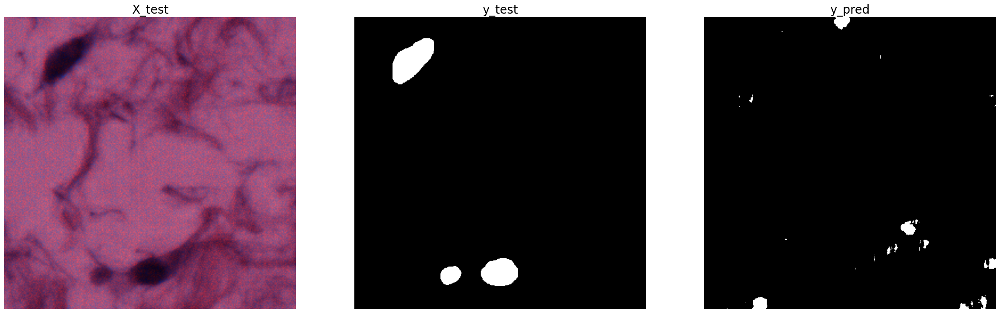

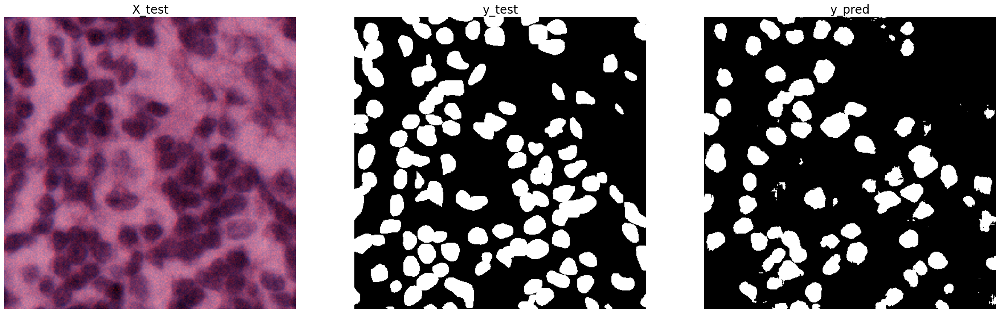

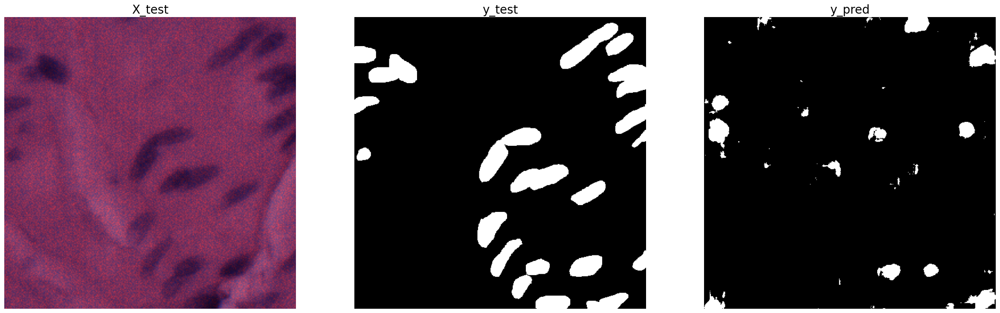

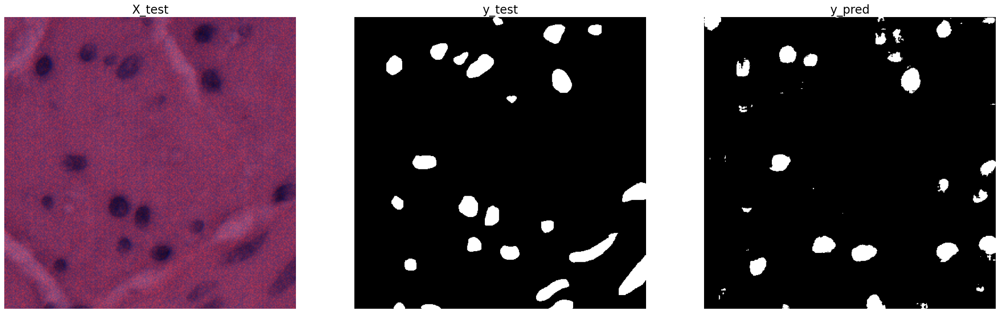

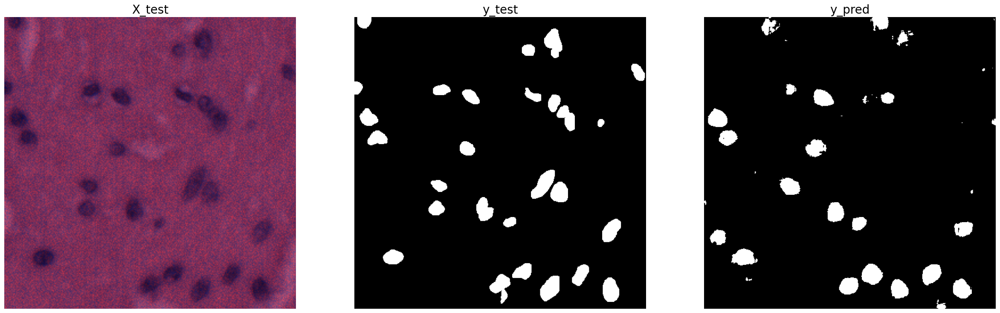

In [8]:
for i in range(5):
    j=1
    plt.figure(figsize=(30,60))
    plt.subplot(5,3,j)
    plt.imshow(cv2.imread(test_image[i]))
    plt.axis('off')
    plt.title('X_test', fontsize = 20)
    j+=1

    plt.subplot(5,3,j)
    plt.imshow(reference_masks[i],cmap='gray')
    plt.axis('off')
    plt.title('y_test', fontsize = 20)
    j+=1

    plt.subplot(5,3,j)
    plt.imshow(pred[i],cmap='gray')
    plt.axis('off')
    plt.title(f'y_pred dice= {d[i]} ', fontsize = 20)
    j+=1

plt.show()

# cryo

In [9]:
train_mask = os.listdir('datasets\\cryonuseg\\train\\mask binary')
train_mask = ['datasets\\cryonuseg\\train\\mask binary\\' + element for element in train_mask]
test_mask = os.listdir('datasets\\cryonuseg\\test\\mask binary')
test_mask = ['datasets\\cryonuseg\\test\\mask binary\\' + element for element in test_mask]
test_mask+=train_mask

train_image  = os.listdir(f'datasets\\cryonuseg\\train\\method_{method}\\reference_{reference}')
train_image = [f'datasets\\cryonuseg\\train\\method_{method}\\reference_{reference}\\' + element for element in train_image]
test_image  = os.listdir(f'datasets\\cryonuseg\\test\\method_{method}\\reference_{reference}')
test_image = [f'datasets\\cryonuseg\\test\\method_{method}\\reference_{reference}\\' + element for element in test_image]
test_image+=train_image

reference_masks = []
nuclei=[]
for i in range(len(test_mask)):
        masks=(cv2.imread(test_mask[i], cv2.IMREAD_GRAYSCALE))
        masks=masks/255
        reference_masks.append(masks)
        nuclei.append(count_nuclei(masks))
nuclei_sum = np.sum(nuclei)

In [10]:
batch_size = 1
dice = []
pred=[]
bpq=[]
aji=[]
n_dice=[]
for model_index, model in enumerate(models):
    d,a,b,nd=0,0,0,0
    print(f"Making predictions with Model {model_index+1}/{5}")
    test_generator = image_mask_generator(test_image, test_mask,batch_size)

    predictions = model.predict(test_generator, steps=(len(test_image) // batch_size))
    predictions=tf.cast((tf.squeeze(predictions) > 0.5), tf.int32)
    pred.append(predictions)
    for i in range(len(test_mask)):
        d+=(dice_coefficient(reference_masks[i],predictions[i]).numpy())
        nd+=(nuclei[i]*(dice_coefficient(reference_masks[i],predictions[i]).numpy())/nuclei_sum)
        a+=(get_fast_aji(reference_masks[i],predictions[i]))
        b+=(get_fast_pq(reference_masks[i],predictions[i]))
    dice.append(d/(len(test_mask)))
    aji.append(a/(len(test_mask)))
    bpq.append(b/(len(test_mask)))
    n_dice.append(nd)
print(dice)
print(aji)
print(bpq)
print(n_dice)

Making predictions with Model 1/5
30/30 [==============================] - 1s 22ms/step
Making predictions with Model 2/5
30/30 [==============================] - 0s 11ms/step
Making predictions with Model 3/5
30/30 [==============================] - 0s 11ms/step
Making predictions with Model 4/5
30/30 [==============================] - 0s 11ms/step
Making predictions with Model 5/5
30/30 [==============================] - 0s 11ms/step
[0.5467738290627797, 0.4857515980799993, 0.46722022046645484, 0.4386119790840894, 0.4382634441057841]
[0.3886206625689781, 0.3375146609662431, 0.32347361980433914, 0.3078395680264105, 0.29827144070044603]
[0.10901184391424197, 0.10648239241512421, 0.10430402630710972, 0.1079336486318514, 0.0988013412572455]
[0.5758355678382562, 0.5158923295099673, 0.48791218339321407, 0.4816454475965169, 0.46602719413818733]


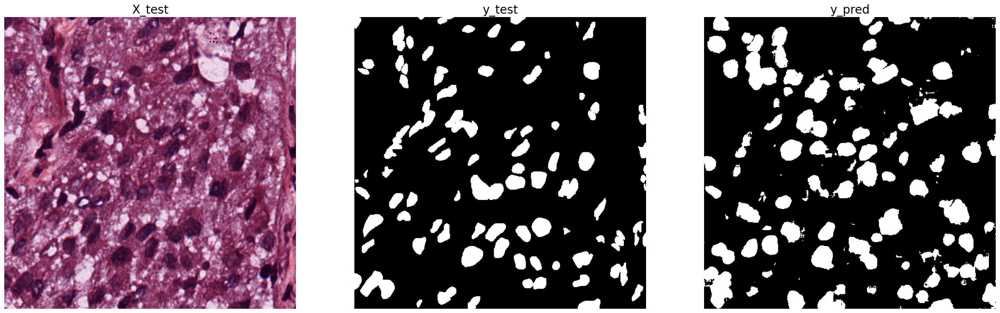

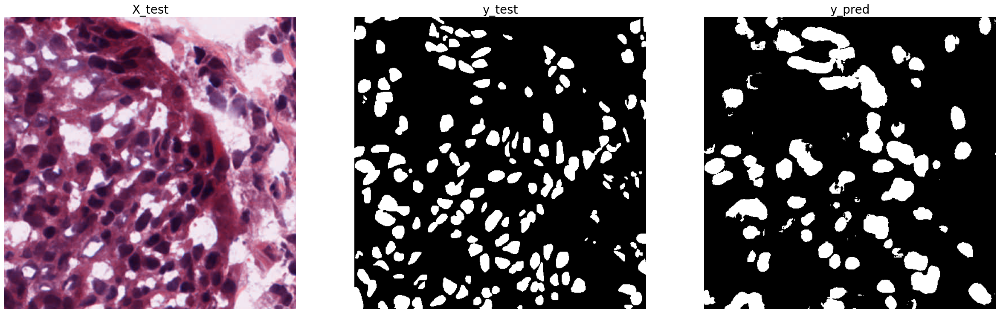

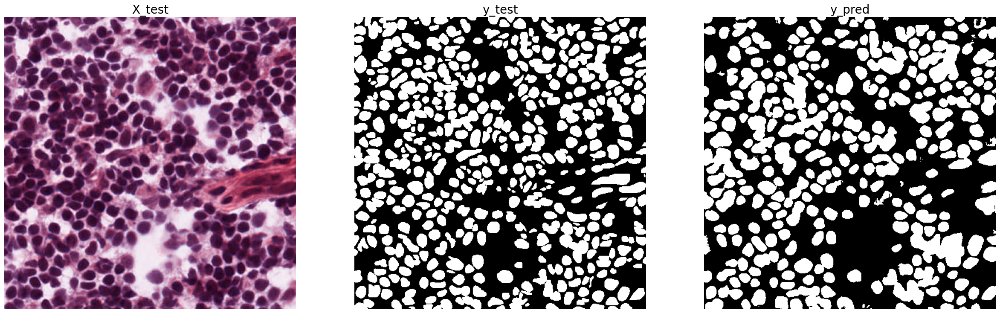

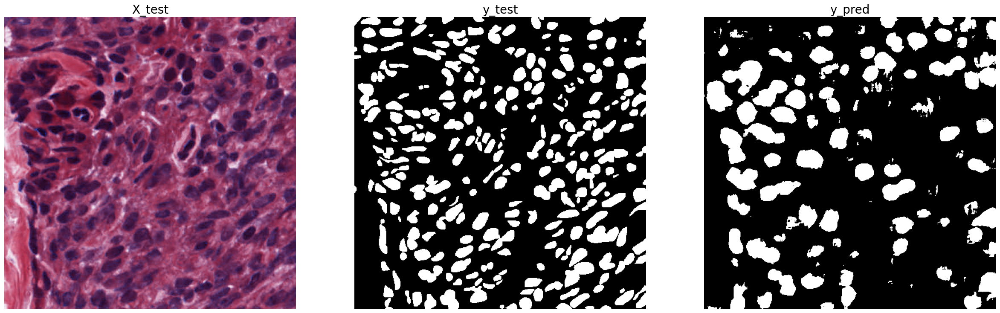

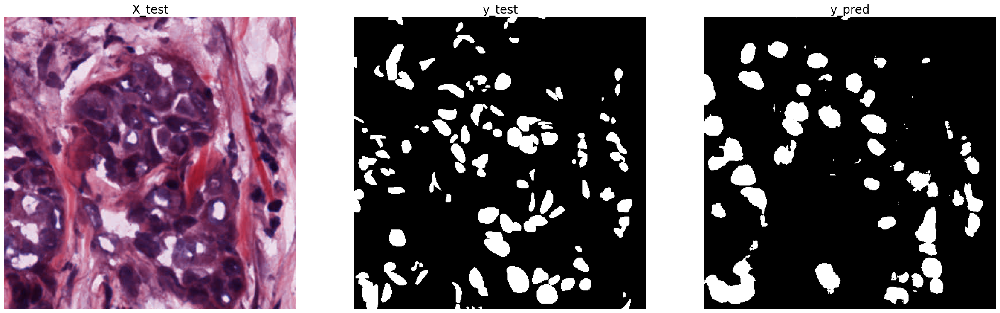

In [11]:
for i in range(5):
    j=1
    plt.figure(figsize=(30,60))
    plt.subplot(5,3,j)
    plt.imshow(cv2.imread(test_image[i]))
    plt.axis('off')
    plt.title('X_test', fontsize = 20)
    j+=1

    plt.subplot(5,3,j)
    plt.imshow(reference_masks[i],cmap='gray')
    plt.axis('off')
    plt.title('y_test', fontsize = 20)
    j+=1

    plt.subplot(5,3,j)
    plt.imshow(pred[0][i],cmap='gray')
    plt.axis('off')
    plt.title('y_pred', fontsize = 20)
    j+=1

plt.show()